In [1]:
import pandas as pd
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px

from IPython.display import Image

## KMeans: All Features 

In [15]:
df = pd.read_csv('data/streamflow_prediction_dataset_averaged_cols.csv')
df = df.set_index('date')
display(df)

# Standardize the data
scaler = StandardScaler()
X = scaler.fit_transform(df)
df = pd.DataFrame(X, columns=df.columns)
display(df)

,WTEQ_BisonLake,WTEQ_McClurePass,PREC_Avg,TAVG_Avg,soilmoisture_Avg_2ft,soilmoisture_Avg_4ft,soilmoisture_Avg_8ft,soilmoisture_Avg_20ft
date,,,,,,,,
2008-03-12,28.6,23.9,26.00,24.80,17.375,10.2,17.74,20.62
2008-03-15,29.2,24.5,26.55,17.55,17.375,10.3,17.88,20.70
2008-03-17,29.3,24.8,26.70,19.35,17.425,10.3,18.04,20.64
2008-03-18,29.3,24.8,26.70,17.85,17.475,10.6,18.06,20.66
2008-03-19,29.4,24.9,26.70,25.50,17.425,10.6,18.06,20.64
...,...,...,...,...,...,...,...,...
2021-07-23,0.0,0.0,24.20,57.50,21.250,13.8,14.60,14.16
2021-07-24,0.0,0.0,24.40,55.85,20.275,13.4,14.38,14.04
2021-07-25,0.0,0.0,24.65,55.15,21.800,13.1,14.24,13.78


,WTEQ_BisonLake,WTEQ_McClurePass,PREC_Avg,TAVG_Avg,soilmoisture_Avg_2ft,soilmoisture_Avg_4ft,soilmoisture_Avg_8ft,soilmoisture_Avg_20ft
0,1.883552,3.196112,0.415239,-0.780671,-0.320641,-1.005935,-0.061222,-0.087600
1,1.943418,3.293490,0.460183,-1.221634,-0.320641,-0.996075,-0.034319,-0.087566
2,1.953396,3.342180,0.472441,-1.112154,-0.311656,-0.996075,-0.003573,-0.087591
3,1.953396,3.342180,0.472441,-1.203387,-0.302671,-0.966494,0.000271,-0.087583
4,1.963373,3.358410,0.472441,-0.738096,-0.311656,-0.966494,0.000271,-0.087591
...,...,...,...,...,...,...,...,...
2991,-0.970057,-0.682804,0.268148,1.208223,0.375667,-0.650968,-0.664616,-0.090370
2992,-0.970057,-0.682804,0.284491,1.107866,0.200467,-0.690409,-0.706892,-0.090422
2993,-0.970057,-0.682804,0.304920,1.065290,0.474498,-0.719989,-0.733795,-0.090533
2994,-0.970057,-0.682804,0.304920,1.305539,0.631728,-0.739710,-0.729952,-0.090679


For n_clusters = 2, the average silhouette_score is : 0.278979440255955
For n_clusters = 3, the average silhouette_score is : 0.30947333950013606
For n_clusters = 4, the average silhouette_score is : 0.316245405519837
For n_clusters = 5, the average silhouette_score is : 0.3307353088244625
For n_clusters = 6, the average silhouette_score is : 0.35581225527993837


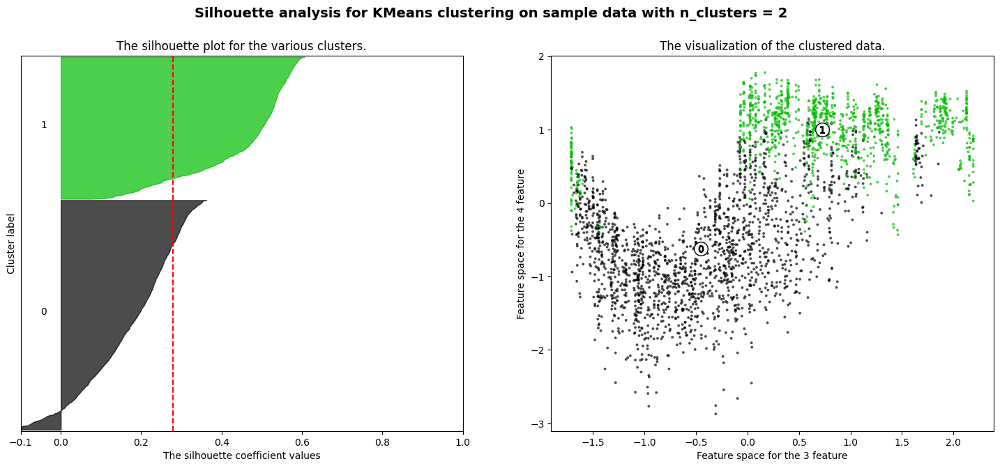

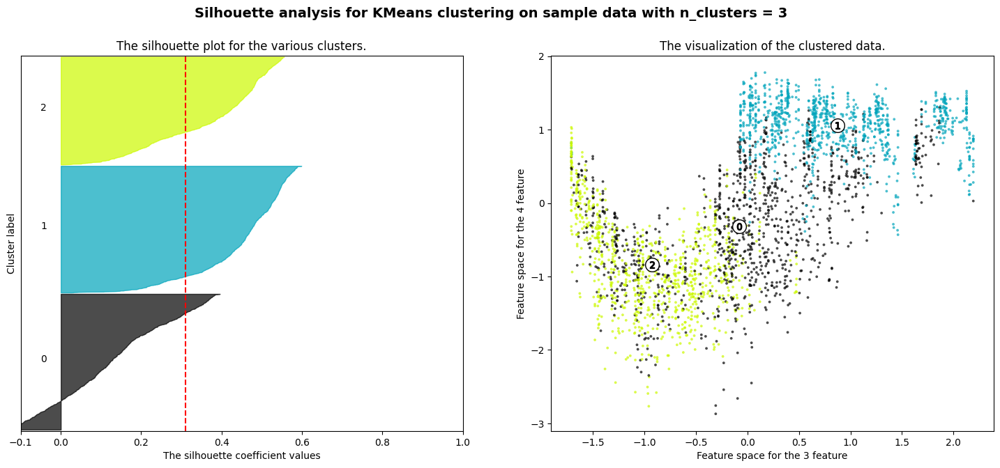

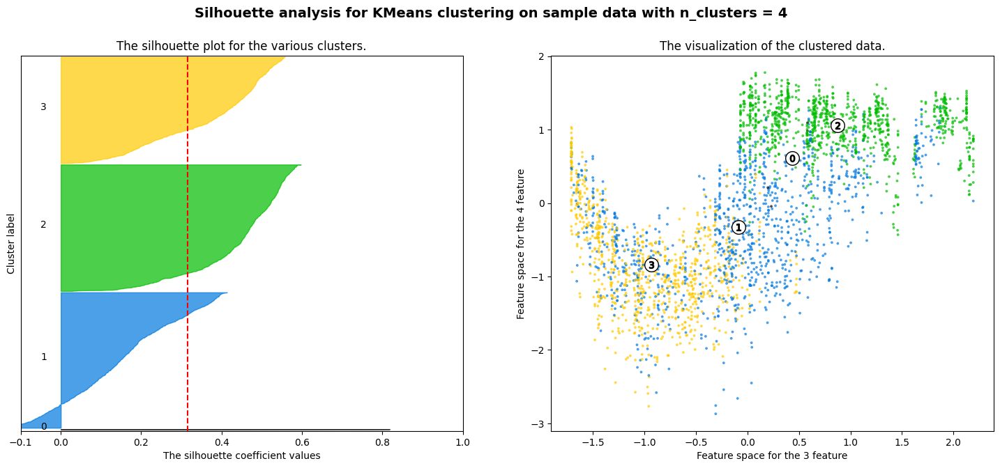

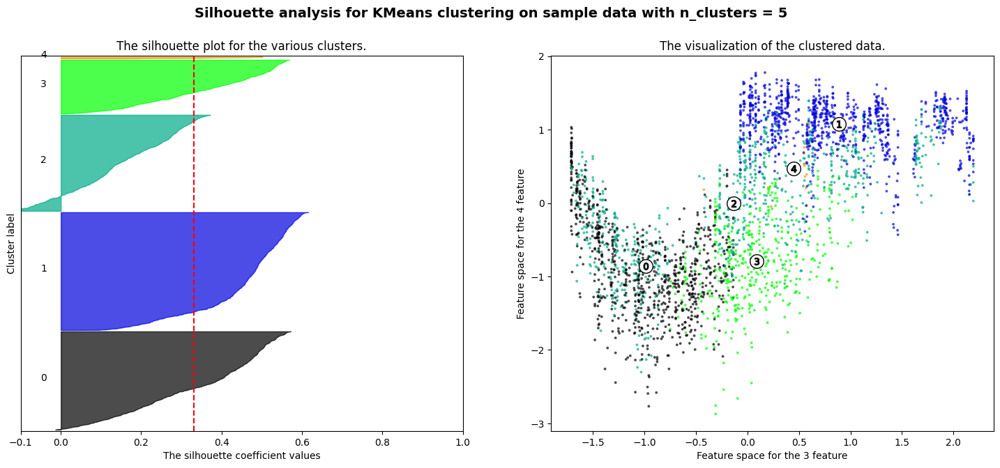

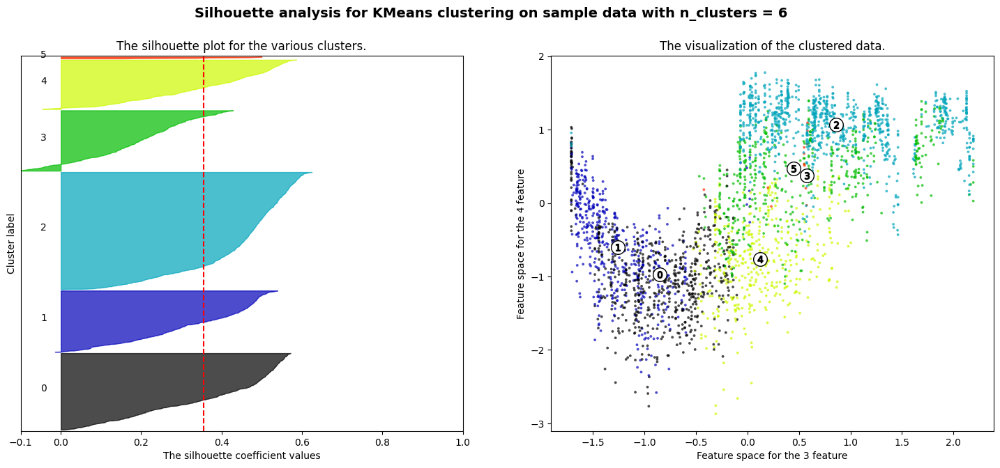

In [18]:
def silhouette_analysis(X, range_n_clusters):
    for n_clusters in range_n_clusters:
        fig, (ax1, ax2) = plt.subplots(1, 2)
        fig.set_size_inches(18, 7)

        ax1.set_xlim([-0.1, 1])
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        cluster_labels = kmeans.fit_predict(X)

        silhouette_avg = silhouette_score(X, cluster_labels)
        print(f"For n_clusters = {n_clusters}, the average silhouette_score "
              f"is : {silhouette_avg}")

        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            ith_cluster_silhouette_values = sample_silhouette_values[
                cluster_labels == i]
            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(np.arange(y_lower, y_upper), 0,
                              ith_cluster_silhouette_values, facecolor=color,
                              edgecolor=color, alpha=0.7)

            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
            y_lower = y_upper + 10

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")

        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
        ax1.set_yticks([])
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

        # 2nd Plot showing the actual clusters formed
        # Change the feature indices here to plot different features
        feature_x = 2  # Index of the feature for the x-axis
        feature_y = 3  # Index of the feature for the y-axis

        colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
        ax2.scatter(X[:, feature_x], X[:, feature_y], marker=".", s=30, lw=0, alpha=0.7,
                    c=colors, edgecolor="k")

        centers = kmeans.cluster_centers_
        ax2.scatter(centers[:, feature_x], centers[:, feature_y], marker="o", c="white",
                    alpha=1, s=200, edgecolor="k")

        for i, c in enumerate(centers):
            ax2.scatter(c[feature_x], c[feature_y], marker=f"${i}$", alpha=1, s=50,
                        edgecolor="k")

        ax2.set_title("The visualization of the clustered data.")
        ax2.set_xlabel(f"Feature space for the {feature_x + 1} feature")
        ax2.set_ylabel(f"Feature space for the {feature_y + 1} feature")

        plt.suptitle((f"Silhouette analysis for KMeans clustering on sample "
                      f"data with n_clusters = {n_clusters}"),
                     fontsize=14, fontweight="bold")

    plt.show()

range_n_clusters = [2, 3, 4, 5, 6]
silhouette_analysis(X, range_n_clusters)

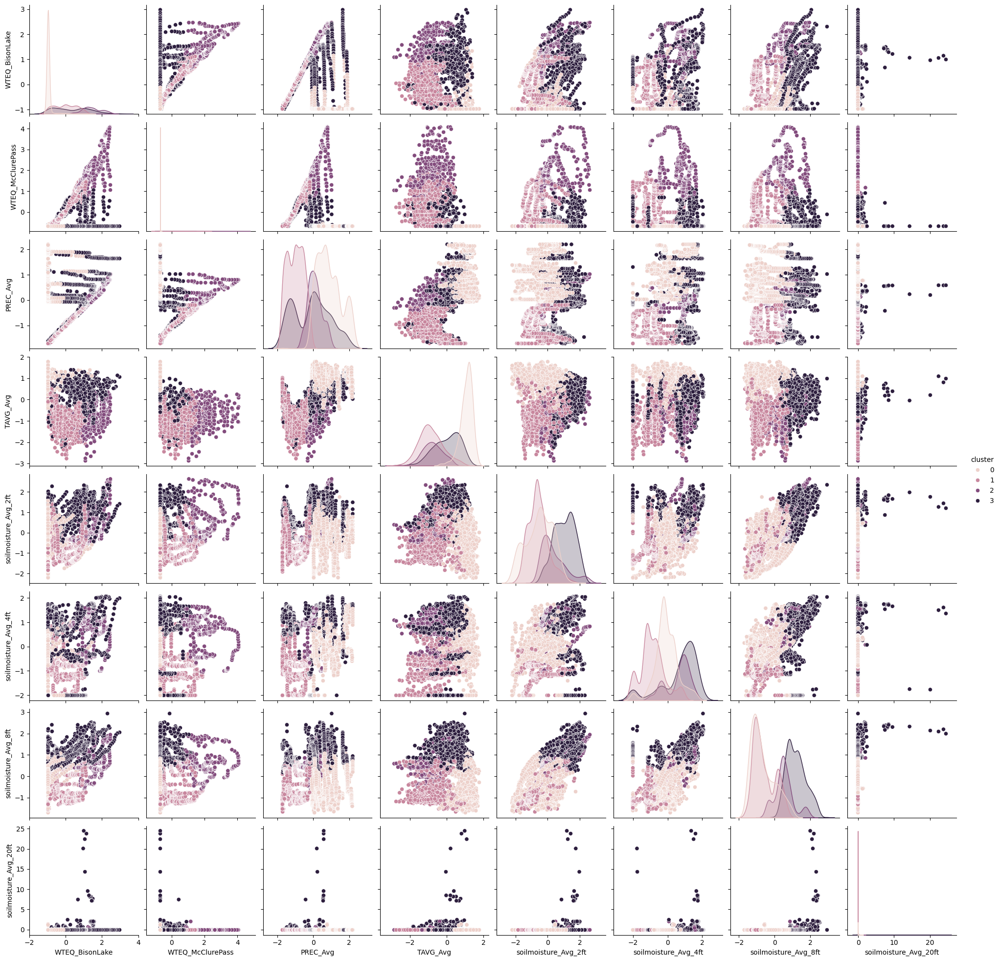

In [19]:
def plot_clusters(df, n_clusters, title='Clusters', x=None, y=None, z=None):
    kmeans = KMeans(n_clusters=n_clusters, n_init=10, random_state=0)
    kmeans.fit(df)
    df['cluster'] = kmeans.predict(df)
    sns.pairplot(df, hue='cluster')
    plt.show()

plot_clusters(df, 4)
del df

## KMeans: Snow Water Equivalent, Precipitation, and Temperature
My initial cleaning steps involved pivoting the dataset to have each station_value_[height depth] combination to be a separate feature. However, with KMeans we would like to retain the labels to see if there are interesting patterns between individual stations. I will utilize the original datasets to perform KMeans below.

In [20]:
df_swe_temp = pd.read_parquet('data/nrcs_snow_water_equivalent_and_temp.parquet')
df_swe_temp = df_swe_temp.set_index(['date','Station'])
df_swe_temp = df_swe_temp.drop(columns=['SNWD', 'TMAX', 'TMIN', 'PRCP'])

display(df_swe_temp)

WTEQ  PREC  TAVG
date       Station                                     
1997-08-01 Station 345 - Bison Lake     0.0  48.2  50.5
1997-08-02 Station 345 - Bison Lake     0.0  48.2  55.0
1997-08-03 Station 345 - Bison Lake     0.0  48.5  54.9
1997-08-04 Station 345 - Bison Lake     0.0  48.6  50.0
1997-08-05 Station 345 - Bison Lake     0.0  48.8  46.0
...                                     ...   ...   ...
2024-09-02 Station 618 - McClure Pass   0.0  32.4  58.1
2024-09-03 Station 345 - Bison Lake     0.0  36.9  52.3
           Station 618 - McClure Pass   0.0  32.4  59.0
2024-09-04 Station 345 - Bison Lake     0.0  37.1  45.5
2024-09-05 Station 345 - Bison Lake     0.0  37.1  43.7

[16245 rows x 3 columns]

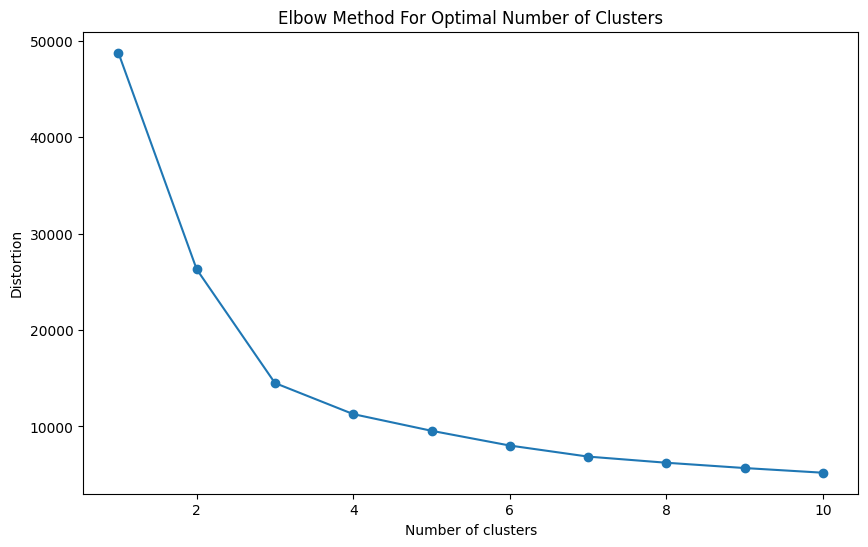

In [21]:
# Perform elbow method analysis
def elbow_method(X, range_n_clusters):
    distortions = []
    for n_clusters in range_n_clusters:
        kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
        kmeans.fit(X)
        distortions.append(kmeans.inertia_)
    
    plt.figure(figsize=(10, 6))
    plt.plot(range_n_clusters, distortions, marker='o')
    plt.xlabel('Number of clusters')
    plt.ylabel('Distortion')
    plt.title('Elbow Method For Optimal Number of Clusters')
    plt.show()

range_n_clusters = range(1, 11)
X = scaler.fit_transform(df_swe_temp.values)
elbow_method(X, range_n_clusters)

In [22]:
# Fit KMeans with 4 clusters
kmeans = KMeans(n_clusters=4, n_init=10, random_state=0)
kmeans.fit(df_swe_temp)
df_swe_temp['cluster'] = kmeans.predict(
    df_swe_temp
)
df_swe_temp = df_swe_temp.reset_index()

# Plot the clusters
fig = px.scatter_3d(
    df_swe_temp,
    x='WTEQ', 
    y='PREC', 
    z='TAVG', 
    color='cluster', 
    hover_data=['date', 'Station']
)
fig.show()

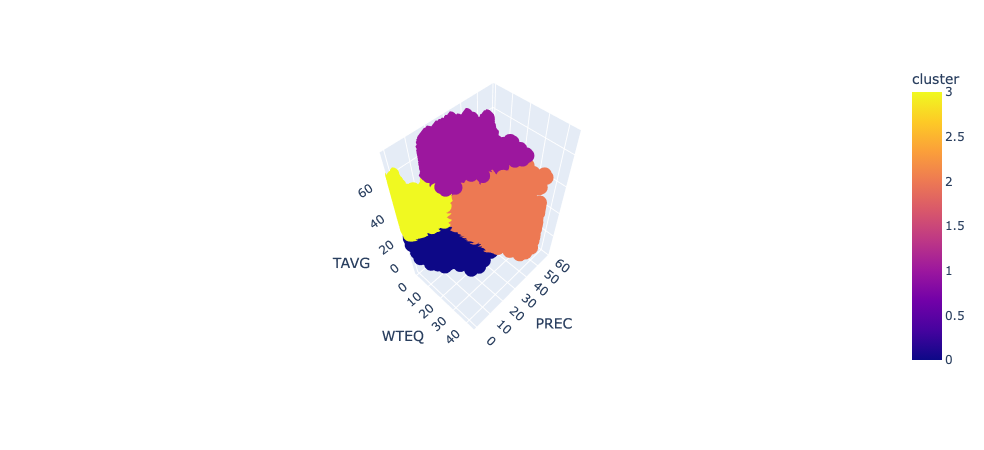

In [23]:
Image(filename='img/swe_clusters.png')

In [24]:
def assign_meteorological_season(date):
    month = date.month
    day = date.day
    
    if month in [3, 4, 5]:
        return 'spring'
    elif month in [6, 7, 8]:
        return 'summer'
    elif month in [9, 10, 11]:
        return 'fall'
    elif month in [12, 1, 2]:
        return 'winter'
    else:
        return 'unknown' 
    
df_swe_temp['season'] = df_swe_temp['date'].apply(assign_meteorological_season)

px.scatter_3d(
    df_swe_temp,
    x='WTEQ', 
    y='PREC', 
    z='TAVG', 
    color='season', 
    hover_data=['date', 'Station', 'cluster']
)

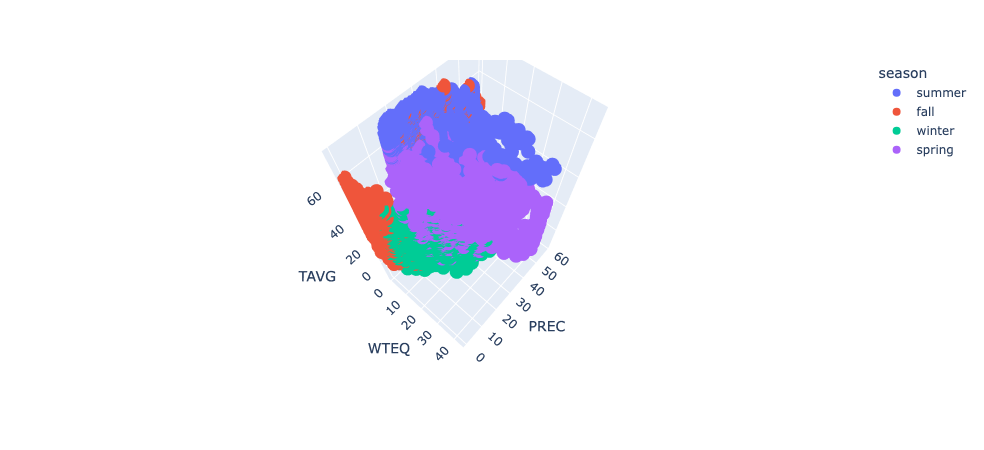

In [25]:
Image(filename='img/swe_seasons.png')

In [26]:
# Fit KMeans with 4 clusters (if not already fitted)
if 'cluster' not in df_swe_temp.columns:
    kmeans = KMeans(n_clusters=4, n_init=10, random_state=0)
    kmeans.fit(df_swe_temp[['WTEQ', 'PREC', 'TAVG']])
    df_swe_temp['cluster'] = kmeans.predict(df_swe_temp[['WTEQ', 'PREC', 'TAVG']])
    df_swe_temp = df_swe_temp.reset_index()

# Create interactive html with centroids
fig = px.scatter_3d(
    df_swe_temp,
    x='WTEQ', 
    y='PREC', 
    z='TAVG', 
    color='cluster', 
    hover_data=['date', 'Station', 'cluster', 'season']
)

# Add centroids to the plot
centroids = kmeans.cluster_centers_
centroid_df = pd.DataFrame(centroids, columns=['WTEQ', 'PREC', 'TAVG'])
centroid_df['cluster'] = range(4)

fig.add_trace(
    px.scatter_3d(
        centroid_df,
        x='WTEQ', 
        y='PREC', 
        z='TAVG', 
        color='cluster'
    ).update_traces(marker=dict(symbol='x', size=12, color='black', opacity=1)).data[0]
)

fig.update_traces(marker=dict(size=5), selector=dict(mode='markers'))

fig.write_html('img/swe_clusters_with_centroids.html')
fig.show()

### Conclusions
The seasonal relationship between temperature, snow water equivalent (WTEQ), and precipitation becomes visible with the use of the KMeans clustering algorithm. Cluster 1 tends to indicate the winter months, where temperatures are low and percipitation has increased, thus driving WTEQ higher. Cluster 2 is generally a mix of hotter spring and summer conditions with high precipitation but low WTEQ. Cluster 3 consists mostly of the spring season, where TAVG is cooler, and PREC and WTEQ are at their peaks. Cluster 4 generally indicates the fall season, where temperatures have a large range, but WTEQ and PREC are at their lows.